In [1]:
# Célula 1: Verificar ambiente
!nvidia-smi
import torch
print(f"PyTorch version: {torch.__version__}")
print(f"CUDA available: {torch.cuda.is_available()}")
print(f"CUDA version: {torch.version.cuda}")
print(f"GPU: {torch.cuda.get_device_name(0) if torch.cuda.is_available() else 'No GPU'}")

# Verificar espaço em disco
!df -h

Wed Dec  3 16:07:37 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   46C    P8              9W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [2]:
# Célula 2: Criar diretórios
import os

# Estrutura organizada
folders = [
    'datasets/original',           # Imagens originais (alta resolução)
    'datasets/lowres',             # Imagens degradadas (baixa resolução)
    'datasets/test',               # Imagens para teste visual
    'models',                      # Modelos pré-treinados
    'results/realesrgan',          # Resultados Real-ESRGAN
    'results/swinir',              # Resultados SwinIR
    'results/comparisons',         # Comparações lado a lado
    'metrics'                      # Resultados de métricas
]

for folder in folders:
    os.makedirs(folder, exist_ok=True)
    print(f"✓ Criado: {folder}")

✓ Criado: datasets/original
✓ Criado: datasets/lowres
✓ Criado: datasets/test
✓ Criado: models
✓ Criado: results/realesrgan
✓ Criado: results/swinir
✓ Criado: results/comparisons
✓ Criado: metrics


# **🔧 PARTE 2: Instalação do Real-ESRGAN**

In [3]:
# Célula 3: Instalar Real-ESRGAN e Corrigir Dependências
!pip install -q realesrgan basicsr facexlib gfpgan

# --- FIX CORREÇÃO DE BUG (Necessário para compatibilidade com Colab atual) ---
!sed -i 's/from torchvision.transforms.functional_tensor import rgb_to_grayscale/from torchvision.transforms.functional import rgb_to_grayscale/' /usr/local/lib/python*/dist-packages/basicsr/data/degradations.py
# -----------------------------------------------------------------------------

# Verificar instalação importando a classe principal
import realesrgan
try:
    from realesrgan import RealESRGANer
    print("✅ Sucesso! A classe RealESRGANer foi importada corretamente.")
except ImportError as e:
    print(f"❌ Erro ao importar RealESRGANer: {e}")

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 172.5/172.5 kB 5.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.8/46.8 kB 2.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.0/178.0 kB 7.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 59.6/59.6 kB 5.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 52.2/52.2 kB 5.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 299.4/299.4 kB 27.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 116.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 256.2/256.2 kB 25.1 MB/s eta 0:00:00
✅ Sucesso! A classe RealESRGANer foi importada corretamente.


In [4]:
# Célula 4: Download de modelos Real-ESRGAN (Links Corrigidos)
!pip install wget # Garante a instalação caso tenha reiniciado

import wget
import os

# Cria a pasta 'models' se ela não existir
os.makedirs('models', exist_ok=True)

models_realesrgan = {
    'RealESRGAN_x4plus': 'https://github.com/xinntao/Real-ESRGAN/releases/download/v0.1.0/RealESRGAN_x4plus.pth',
    'RealESRNet_x4plus': 'https://github.com/xinntao/Real-ESRGAN/releases/download/v0.1.1/RealESRNet_x4plus.pth', # <--- URL CORRIGIDA
    'RealESRGAN_x4plus_anime_6B': 'https://github.com/xinntao/Real-ESRGAN/releases/download/v0.2.2.4/RealESRGAN_x4plus_anime_6B.pth',
    'RealESRGAN_x2plus': 'https://github.com/xinntao/Real-ESRGAN/releases/download/v0.2.1/RealESRGAN_x2plus.pth',
}

print("Baixando modelos Real-ESRGAN...")
for name, url in models_realesrgan.items():
    output_path = f'models/{name}.pth'
    if not os.path.exists(output_path):
        print(f"  Baixando {name}...")
        try:
            wget.download(url, output_path)
            print(f" ✓")
        except Exception as e:
            print(f" ❌ Falha ao baixar {name}: Link pode estar offline ou incorreto.")
    else:
        print(f"  {name} já existe ✓")

  Preparing metadata (setup.py) ... done
  Created wheel for wget: filename=wget-3.2-py3-none-any.whl size=9655 sha256=881688715b5112326ed12e39595c1dc5e6dac5cd603e6e340f672625927ad763
  Stored in directory: /root/.cache/pip/wheels/01/46/3b/e29ffbe4ebe614ff224bad40fc6a5773a67a163251585a13a9
Successfully built wget
Baixando modelos Real-ESRGAN...
  Baixando RealESRGAN_x4plus...
 ✓
  Baixando RealESRNet_x4plus...
 ✓
  Baixando RealESRGAN_x4plus_anime_6B...
 ✓
  Baixando RealESRGAN_x2plus...
 ✓


In [5]:
# Célula 5: Teste básico Real-ESRGAN
from PIL import Image
import numpy as np
import cv2
from realesrgan import RealESRGANer
from basicsr.archs.rrdbnet_arch import RRDBNet

def test_realesrgan():
    # Configurar modelo
    model = RRDBNet(num_in_ch=3, num_out_ch=3, num_feat=64,
                    num_block=23, num_grow_ch=32, scale=4)

    upsampler = RealESRGANer(
        scale=4,
        model_path='models/RealESRGAN_x4plus.pth',
        model=model,
        tile=0,  # 0 = sem tiling (para imagens pequenas)
        tile_pad=10,
        pre_pad=0,
        half=True  # FP16 para economizar memória
    )

    # Criar imagem de teste
    test_img = np.random.randint(0, 255, (128, 128, 3), dtype=np.uint8)

    # Upscale
    output, _ = upsampler.enhance(test_img, outscale=4)

    print(f"✓ Real-ESRGAN funcionando!")
    print(f"  Input shape: {test_img.shape}")
    print(f"  Output shape: {output.shape}")
    return True

test_realesrgan()

✓ Real-ESRGAN funcionando!
  Input shape: (128, 128, 3)
  Output shape: (512, 512, 3)


True

# **🔧 PARTE 3: Instalação do SwinIR**

In [6]:
# Célula 6: Instalar SwinIR
!git clone https://github.com/JingyunLiang/SwinIR.git
%cd SwinIR

# Instalar dependências
!pip install timm
!pip install einops

# Voltar ao diretório raiz
%cd ..

Cloning into 'SwinIR'...
remote: Enumerating objects: 333, done.
remote: Counting objects: 100% (10/10), done.
remote: Compressing objects: 100% (8/8), done.
remote: Total 333 (delta 6), reused 2 (delta 2), pack-reused 323 (from 2)
Receiving objects: 100% (333/333), 29.84 MiB | 13.24 MiB/s, done.
Resolving deltas: 100% (119/119), done.
/content/SwinIR
/content


In [7]:
# Célula 7: Download modelos SwinIR
models_swinir = {
    # Real-world SR
    'SwinIR_realworld_x4': 'https://github.com/JingyunLiang/SwinIR/releases/download/v0.0/003_realSR_BSRGAN_DFOWMFC_s64w8_SwinIR-L_x4_GAN.pth',
    'SwinIR_realworld_x2': 'https://github.com/JingyunLiang/SwinIR/releases/download/v0.0/003_realSR_BSRGAN_DFO_s64w8_SwinIR-M_x2_GAN.pth',

    # Classical SR (para comparação em dados sintéticos)
    'SwinIR_classical_x4': 'https://github.com/JingyunLiang/SwinIR/releases/download/v0.0/001_classicalSR_DIV2K_s48w8_SwinIR-M_x4.pth',
}

print("Baixando modelos SwinIR...")
for name, url in models_swinir.items():
    output_path = f'models/{name}.pth'
    if not os.path.exists(output_path):
        print(f"  Baixando {name}...")
        wget.download(url, output_path)
        print(f" ✓")
    else:
        print(f"  {name} já existe ✓")

Baixando modelos SwinIR...
  Baixando SwinIR_realworld_x4...
 ✓
  Baixando SwinIR_realworld_x2...
 ✓
  Baixando SwinIR_classical_x4...
 ✓


In [8]:
# Célula 8: Teste básico SwinIR
import sys
sys.path.append('SwinIR')

import torch
from models.network_swinir import SwinIR as net

def test_swinir():
    # Configurar modelo para Real-world SR x4
    model = net(
        upscale=4,
        in_chans=3,
        img_size=64,
        window_size=8,
        img_range=1.,
        depths=[6, 6, 6, 6, 6, 6, 6, 6, 6],
        embed_dim=240,
        num_heads=[8, 8, 8, 8, 8, 8, 8, 8, 8],
        mlp_ratio=2,
        upsampler='nearest+conv',
        resi_connection='3conv'
    )

    # Carregar pesos
    param_key_g = 'params_ema'
    pretrained_model = torch.load('models/SwinIR_realworld_x4.pth')
    model.load_state_dict(
        pretrained_model[param_key_g] if param_key_g in pretrained_model.keys()
        else pretrained_model,
        strict=True
    )

    model.eval()
    model = model.cuda()

    # Teste
    test_tensor = torch.rand(1, 3, 128, 128).cuda()
    with torch.no_grad():
        output = model(test_tensor)

    print(f"✓ SwinIR funcionando!")
    print(f"  Input shape: {test_tensor.shape}")
    print(f"  Output shape: {output.shape}")
    return True

test_swinir()

/usr/local/lib/python3.12/dist-packages/timm/models/layers/__init__.py:48: FutureWarning: Importing from timm.models.layers is deprecated, please import via timm.layers
  warnings.warn(f"Importing from {__name__} is deprecated, please import via timm.layers", FutureWarning)
/usr/local/lib/python3.12/dist-packages/torch/functional.py:505: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at /pytorch/aten/src/ATen/native/TensorShape.cpp:4317.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


✓ SwinIR funcionando!
  Input shape: torch.Size([1, 3, 128, 128])
  Output shape: torch.Size([1, 3, 512, 512])


True

# **📊 PARTE 4: Datasets**

In [9]:
# Célula 9: Escolher e baixar dataset

# OPÇÃO 1: DIV2K (Padrão para SR - RECOMENDADO)
def download_div2k():
    """
    DIV2K: 800 treino + 100 validação + 100 teste
    Imagens de alta qualidade 2K
    """
    !mkdir -p datasets/DIV2K

    # Validation set (100 imagens HR)
    !wget http://data.vision.ee.ethz.ch/cvl/DIV2K/DIV2K_valid_HR.zip
    !unzip -q DIV2K_valid_HR.zip -d datasets/DIV2K/
    !rm DIV2K_valid_HR.zip

    print("✓ DIV2K validation set baixado (100 imagens)")
    print("  Localização: datasets/DIV2K/DIV2K_valid_HR/")

# OPÇÃO 2: Set5, Set14, BSD100 (Benchmarks clássicos)
def download_benchmark_datasets():
    """
    Datasets pequenos mas padrão da literatura
    """
    !git clone https://github.com/jbhuang0604/SelfExSR.git datasets/benchmarks
    print("✓ Benchmarks baixados (Set5, Set14, BSD100, Urban100)")

# OPÇÃO 3: Unsplash (Imagens diversas e bonitas)
def download_unsplash_lite():
    """
    Subset do Unsplash para testes visuais
    """
    !pip install unsplash-python
    # Código para baixar via API (requer chave gratuita)
    print("Configure API key em: https://unsplash.com/developers")

# OPÇÃO 4: Seu próprio dataset
def use_custom_images():
    """
    Upload manual de imagens
    """
    from google.colab import files
    print("Faça upload das suas imagens...")
    uploaded = files.upload()

    for filename in uploaded.keys():
        !mv {filename} datasets/original/

    print(f"✓ {len(uploaded)} imagens carregadas")

# Escolha uma opção:
print("Escolha seu dataset:")
print("1. DIV2K (recomendado para avaliação rigorosa)")
print("2. Benchmarks clássicos (Set5, Set14, etc)")
print("3. Upload manual (para testes visuais interessantes)")

# Executar a opção desejada:
download_div2k()  # Recomendado para começar

Escolha seu dataset:
1. DIV2K (recomendado para avaliação rigorosa)
2. Benchmarks clássicos (Set5, Set14, etc)
3. Upload manual (para testes visuais interessantes)
--2025-12-03 16:08:50--  http://data.vision.ee.ethz.ch/cvl/DIV2K/DIV2K_valid_HR.zip
Resolving data.vision.ee.ethz.ch (data.vision.ee.ethz.ch)... 129.132.52.178, 2001:67c:10ec:36c2::178
Connecting to data.vision.ee.ethz.ch (data.vision.ee.ethz.ch)|129.132.52.178|:80... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://data.vision.ee.ethz.ch/cvl/DIV2K/DIV2K_valid_HR.zip [following]
--2025-12-03 16:08:51--  https://data.vision.ee.ethz.ch/cvl/DIV2K/DIV2K_valid_HR.zip
Connecting to data.vision.ee.ethz.ch (data.vision.ee.ethz.ch)|129.132.52.178|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 448993893 (428M) [application/zip]
Saving to: ‘DIV2K_valid_HR.zip’

DIV2K_valid_HR.zip  100%[===================>] 428.19M  7.78MB/s    in 40s     

2025-12-03 16:09:31 (10.8 MB/s) - ‘DIV2

In [10]:
# Célula 10: Degradar imagens para criar dataset LR
from PIL import Image
import os
from tqdm import tqdm

def create_lowres_dataset(
    input_dir='datasets/DIV2K/DIV2K_valid_HR',
    output_dir='datasets/lowres',
    scale=4,
    degradation='bicubic'  # 'bicubic', 'bilinear', 'nearest'
):
    """
    Cria versões de baixa resolução das imagens
    """
    os.makedirs(output_dir, exist_ok=True)

    image_files = [f for f in os.listdir(input_dir)
                   if f.lower().endswith(('.png', '.jpg', '.jpeg'))]

    print(f"Criando imagens de baixa resolução (scale={scale}, método={degradation})...")

    for img_name in tqdm(image_files):
        # Carregar imagem HR
        img_path = os.path.join(input_dir, img_name)
        img_hr = Image.open(img_path).convert('RGB')

        # Calcular nova resolução
        w, h = img_hr.size
        w_lr, h_lr = w // scale, h // scale

        # Degradar
        if degradation == 'bicubic':
            img_lr = img_hr.resize((w_lr, h_lr), Image.BICUBIC)
        elif degradation == 'bilinear':
            img_lr = img_hr.resize((w_lr, h_lr), Image.BILINEAR)
        else:
            img_lr = img_lr.resize((w_lr, h_lr), Image.NEAREST)

        # Salvar
        output_path = os.path.join(output_dir, img_name)
        img_lr.save(output_path)

        # Também salvar HR na pasta original (para comparação)
        os.makedirs('datasets/original', exist_ok=True)
        img_hr.save(os.path.join('datasets/original', img_name))

    print(f"✓ {len(image_files)} pares LR-HR criados")
    print(f"  LR: {output_dir}")
    print(f"  HR: datasets/original")

# Executar
create_lowres_dataset(scale=4)

Criando imagens de baixa resolução (scale=4, método=bicubic)...


100%|██████████| 100/100 [02:07<00:00,  1.28s/it]

✓ 100 pares LR-HR criados
  LR: datasets/lowres
  HR: datasets/original


In [11]:
# Célula 11: Baixar imagens degradadas naturalmente
def download_realsr_dataset():
    """
    RealSR: Imagens com degradação real (não sintética)
    Melhor para testar em cenários práticos
    """
    !mkdir -p datasets/RealSR

    # V3 validation set
    !wget https://github.com/jbhuang0604/SelfExSR/raw/master/data/RealSR/version3/RealSR_val_data.zip
    !unzip -q RealSR_val_data.zip -d datasets/RealSR/
    !rm RealSR_val_data.zip

    print("✓ RealSR dataset baixado")
    print("  Degradação: Câmeras reais (não sintética)")

# Opcional: execute se quiser testar degradação real
# download_realsr_dataset()

# **🔬 PARTE 5: Pipeline de Inferência**

In [12]:
# Célula 12: Wrapper Real-ESRGAN
import cv2
import numpy as np
from PIL import Image
from realesrgan import RealESRGANer
from basicsr.archs.rrdbnet_arch import RRDBNet
import torch

class RealESRGANInference:
    def __init__(self, model_name='RealESRGAN_x4plus', scale=4, tile=0):
        """
        model_name: 'RealESRGAN_x4plus', 'RealESRNet_x4plus', etc
        tile: 0 para sem tiling, 400-800 para imagens grandes
        """
        self.model_name = model_name
        self.scale = scale

        # Configurar arquitetura
        if 'anime' in model_name:
            num_block = 6
        else:
            num_block = 23

        model = RRDBNet(
            num_in_ch=3,
            num_out_ch=3,
            num_feat=64,
            num_block=num_block,
            num_grow_ch=32,
            scale=scale
        )

        # Criar upsampler
        self.upsampler = RealESRGANer(
            scale=scale,
            model_path=f'models/{model_name}.pth',
            model=model,
            tile=tile,
            tile_pad=10,
            pre_pad=0,
            half=True,  # FP16
            device=torch.device('cuda' if torch.cuda.is_available() else 'cpu')
        )

        print(f"✓ Real-ESRGAN carregado: {model_name}")

    def inference(self, image_path, output_path=None):
        """
        Processa uma imagem
        """
        # Carregar imagem
        img = cv2.imread(image_path, cv2.IMREAD_COLOR)

        # Upscale
        output, _ = self.upsampler.enhance(img, outscale=self.scale)

        # Salvar
        if output_path:
            cv2.imwrite(output_path, output)

        return output

    def batch_inference(self, input_dir, output_dir):
        """
        Processa um diretório inteiro
        """
        os.makedirs(output_dir, exist_ok=True)

        image_files = [f for f in os.listdir(input_dir)
                       if f.lower().endswith(('.png', '.jpg', '.jpeg'))]

        print(f"Processando {len(image_files)} imagens com {self.model_name}...")

        results = []
        for img_name in tqdm(image_files):
            input_path = os.path.join(input_dir, img_name)
            output_path = os.path.join(output_dir, img_name)

            try:
                self.inference(input_path, output_path)
                results.append({'image': img_name, 'status': 'success'})
            except Exception as e:
                print(f"Erro em {img_name}: {e}")
                results.append({'image': img_name, 'status': 'error', 'error': str(e)})

        return results

# Testar
model_realesrgan = RealESRGANInference('RealESRGAN_x4plus', scale=4)
print("Real-ESRGAN pronto para uso!")

✓ Real-ESRGAN carregado: RealESRGAN_x4plus
Real-ESRGAN pronto para uso!


In [13]:
# Célula 13: Wrapper SwinIR
import sys
sys.path.append('SwinIR')

import torch
import numpy as np
from models.network_swinir import SwinIR as net
import cv2
from PIL import Image

class SwinIRInference:
    def __init__(self, model_name='SwinIR_realworld_x4', scale=4):
        """
        model_name: 'SwinIR_realworld_x4', 'SwinIR_classical_x4', etc
        """
        self.model_name = model_name
        self.scale = scale
        self.device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

        # Configurações por modelo
        if 'realworld' in model_name and 'x4' in model_name:
            self.model = net(
                upscale=4,
                in_chans=3,
                img_size=64,
                window_size=8,
                img_range=1.,
                depths=[6, 6, 6, 6, 6, 6, 6, 6, 6],
                embed_dim=240,
                num_heads=[8, 8, 8, 8, 8, 8, 8, 8, 8],
                mlp_ratio=2,
                upsampler='nearest+conv',
                resi_connection='3conv'
            )
            param_key = 'params_ema'
        elif 'classical' in model_name:
            self.model = net(
                upscale=4,
                in_chans=3,
                img_size=48,
                window_size=8,
                img_range=1.,
                depths=[6, 6, 6, 6, 6, 6],
                embed_dim=180,
                num_heads=[6, 6, 6, 6, 6, 6],
                mlp_ratio=2,
                upsampler='pixelshuffle',
                resi_connection='1conv'
            )
            param_key = 'params'

        # Carregar pesos
        pretrained_model = torch.load(f'models/{model_name}.pth')
        self.model.load_state_dict(
            pretrained_model[param_key] if param_key in pretrained_model.keys()
            else pretrained_model,
            strict=True
        )

        self.model.eval()
        self.model = self.model.to(self.device)

        print(f"✓ SwinIR carregado: {model_name}")

    def inference(self, image_path, output_path=None):
        """
        Processa uma imagem
        """
        # Carregar e preprocessar
        img = cv2.imread(image_path, cv2.IMREAD_COLOR).astype(np.float32) / 255.
        img = torch.from_numpy(np.transpose(img[:, :, [2, 1, 0]], (2, 0, 1))).float()
        img = img.unsqueeze(0).to(self.device)

        # Inferência com tiling se necessário
        with torch.no_grad():
            # Window size para tiling
            window_size = 8
            _, _, h_old, w_old = img.size()
            h_pad = (h_old // window_size + 1) * window_size - h_old
            w_pad = (w_old // window_size + 1) * window_size - w_old
            img = torch.cat([img, torch.flip(img, [2])], 2)[:, :, :h_old + h_pad, :]
            img = torch.cat([img, torch.flip(img, [3])], 3)[:, :, :, :w_old + w_pad]

            output = self.model(img)

            output = output[..., :h_old * self.scale, :w_old * self.scale]

        # Pós-processar
        output = output.data.squeeze().float().cpu().clamp_(0, 1).numpy()
        output = np.transpose(output[[2, 1, 0], :, :], (1, 2, 0))
        output = (output * 255.0).round().astype(np.uint8)

        # Salvar
        if output_path:
            cv2.imwrite(output_path, output)

        return output

    def batch_inference(self, input_dir, output_dir):
        """
        Processa um diretório inteiro
        """
        os.makedirs(output_dir, exist_ok=True)

        image_files = [f for f in os.listdir(input_dir)
                       if f.lower().endswith(('.png', '.jpg', '.jpeg'))]

        print(f"Processando {len(image_files)} imagens com {self.model_name}...")

        results = []
        for img_name in tqdm(image_files):
            input_path = os.path.join(input_dir, img_name)
            output_path = os.path.join(output_dir, img_name)

            try:
                self.inference(input_path, output_path)
                results.append({'image': img_name, 'status': 'success'})
            except Exception as e:
                print(f"Erro em {img_name}: {e}")
                results.append({'image': img_name, 'status': 'error', 'error': str(e)})

        return results

# Testar
model_swinir = SwinIRInference('SwinIR_realworld_x4', scale=4)
print("SwinIR pronto para uso!")

✓ SwinIR carregado: SwinIR_realworld_x4
SwinIR pronto para uso!


# **🎯 PARTE 6: Executar Experimentos**

In [14]:
# Célula 14: Processar todas as imagens
import time

# Diretório de entrada
input_dir = 'datasets/lowres'

# Processar com Real-ESRGAN
print("="*50)
print("PROCESSANDO COM REAL-ESRGAN")
print("="*50)
start = time.time()
results_realesrgan = model_realesrgan.batch_inference(
    input_dir,
    'results/realesrgan'
)
time_realesrgan = time.time() - start
print(f"✓ Concluído em {time_realesrgan:.2f}s")

# Processar com SwinIR
print("\n" + "="*50)
print("PROCESSANDO COM SWINIR")
print("="*50)
start = time.time()
results_swinir = model_swinir.batch_inference(
    input_dir,
    'results/swinir'
)
time_swinir = time.time() - start
print(f"✓ Concluído em {time_swinir:.2f}s")

# Resumo
print("\n" + "="*50)
print("RESUMO")
print("="*50)
print(f"Real-ESRGAN: {time_realesrgan:.2f}s ({len(results_realesrgan)} imagens)")
print(f"SwinIR: {time_swinir:.2f}s ({len(results_swinir)} imagens)")
print(f"Velocidade: Real-ESRGAN é {time_swinir/time_realesrgan:.2f}x mais rápido"
      if time_realesrgan < time_swinir
      else f"SwinIR é {time_realesrgan/time_swinir:.2f}x mais rápido")

PROCESSANDO COM REAL-ESRGAN
Processando 100 imagens com RealESRGAN_x4plus...


100%|██████████| 100/100 [02:05<00:00,  1.25s/it]


✓ Concluído em 125.08s

PROCESSANDO COM SWINIR
Processando 100 imagens com SwinIR_realworld_x4...


100%|██████████| 100/100 [14:31<00:00,  8.71s/it]

✓ Concluído em 871.15s

RESUMO
Real-ESRGAN: 125.08s (100 imagens)
SwinIR: 871.15s (100 imagens)
Velocidade: Real-ESRGAN é 6.96x mais rápido


# **📊 PARTE 7: Avaliação Quantitativa (Métricas):**

In [15]:
# Célula 15: Instalar métricas
!pip install lpips
!pip install pytorch-fid
!pip install piq
!pip install scikit-image

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.8/53.8 kB 4.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 106.9/106.9 kB 9.5 MB/s eta 0:00:00


In [16]:
# Célula 16: Funções para métricas
import torch
import lpips
from skimage.metrics import structural_similarity as ssim
from skimage.metrics import peak_signal_noise_ratio as psnr
import cv2
import numpy as np
from PIL import Image
import piq

class MetricsCalculator:
    def __init__(self):
        self.lpips_fn = lpips.LPIPS(net='alex').cuda()

    def calculate_psnr(self, img1_path, img2_path):
        """Peak Signal-to-Noise Ratio"""
        img1 = cv2.imread(img1_path)
        img2 = cv2.imread(img2_path)

        # Redimensionar se necessário
        if img1.shape != img2.shape:
            img2 = cv2.resize(img2, (img1.shape[1], img1.shape[0]))

        return psnr(img1, img2)

    def calculate_ssim(self, img1_path, img2_path):
        """Structural Similarity Index"""
        img1 = cv2.imread(img1_path)
        img2 = cv2.imread(img2_path)

        if img1.shape != img2.shape:
            img2 = cv2.resize(img2, (img1.shape[1], img1.shape[0]))

        return ssim(img1, img2, channel_axis=2, data_range=255)

    def calculate_lpips(self, img1_path, img2_path):
        """Learned Perceptual Image Patch Similarity"""
        # Carregar e normalizar para [-1, 1]
        img1 = lpips.im2tensor(lpips.load_image(img1_path)).cuda()
        img2 = lpips.im2tensor(lpips.load_image(img2_path)).cuda()

        # Redimensionar se necessário
        if img1.shape != img2.shape:
            img2 = torch.nn.functional.interpolate(
                img2, size=img1.shape[2:], mode='bilinear', align_corners=False
            )

        with torch.no_grad():
            dist = self.lpips_fn(img1, img2)

        return dist.item()

    def calculate_niqe(self, img_path):
        """
        Natural Image Quality Evaluator (no-reference)
        Menor é melhor
        """
        img = cv2.imread(img_path)
        img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

        # Usar piq para NIQE
        img_tensor = torch.from_numpy(img).permute(2, 0, 1).unsqueeze(0).float() / 255.0
        score = piq.niqe(img_tensor.cuda(), reduction='none')

        return score.item()

    def evaluate_pair(self, gt_path, pred_path, method_name):
        """
        Calcula todas as métricas para um par de imagens
        """
        metrics = {
            'method': method_name,
            'psnr': self.calculate_psnr(gt_path, pred_path),
            'ssim': self.calculate_ssim(gt_path, pred_path),
            'lpips': self.calculate_lpips(gt_path, pred_path),
            'niqe': self.calculate_niqe(pred_path)
        }

        return metrics

# Inicializar
calculator = MetricsCalculator()
print("✓ Calculadora de métricas pronta!")

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]


/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Downloading: "https://download.pytorch.org/models/alexnet-owt-7be5be79.pth" to /root/.cache/torch/hub/checkpoints/alexnet-owt-7be5be79.pth


100%|██████████| 233M/233M [00:01<00:00, 143MB/s]


Loading model from: /usr/local/lib/python3.12/dist-packages/lpips/weights/v0.1/alex.pth
✓ Calculadora de métricas pronta!


In [18]:
# Célula 17: Calcular métricas (Corrigida com pyiqa)

# 1. Instalação de segurança (caso o ambiente tenha resetado)
!pip install -q pyiqa piq

import pandas as pd
import os
import cv2
import torch
import numpy as np
import pyiqa
from piq import ssim, psnr, LPIPS
from tqdm import tqdm

# --- 2. REDEFINIÇÃO DA CLASSE CALCULADORA (CORREÇÃO DO BUG) ---
class MetricsCalculator:
    def __init__(self, device):
        self.device = device
        print(f"Configurando métricas no dispositivo: {device}")

        # LPIPS (via PIQ)
        try:
            self.lpips = LPIPS(replace_pooling=True, reduction='none').to(device)
        except:
            print("⚠️ Erro ao carregar LPIPS. Será 0.")
            self.lpips = None

        # NIQE (via PYIQA - A correção principal)
        try:
            self.niqe = pyiqa.create_metric('niqe', device=device)
        except Exception as e:
            print(f"⚠️ Erro ao carregar NIQE ({e}). Será 0.")
            self.niqe = None

    def read_image(self, path):
        img = cv2.imread(path)
        if img is None:
            raise ValueError(f"Imagem não encontrada: {path}")
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB).astype(np.float32) / 255.0
        img = torch.from_numpy(img).permute(2, 0, 1).unsqueeze(0)
        return img.to(self.device)

    def evaluate_pair(self, gt_path, pred_path, method_name):
        gt = self.read_image(gt_path)
        pred = self.read_image(pred_path)

        # Ajuste de tamanho (crop)
        if gt.shape != pred.shape:
            h = min(gt.shape[2], pred.shape[2])
            w = min(gt.shape[3], pred.shape[3])
            gt = gt[:, :, :h, :w]
            pred = pred[:, :, :h, :w]

        # Métricas
        p = psnr(pred, gt, data_range=1.0).item()
        s = ssim(pred, gt, data_range=1.0).item()

        l = 0.0
        if self.lpips:
            with torch.no_grad(): l = self.lpips(pred, gt).item()

        n = 0.0
        if self.niqe:
            with torch.no_grad(): n = self.niqe(pred).item()

        return {
            'Method': method_name,
            'PSNR': round(p, 2),
            'SSIM': round(s, 4),
            'LPIPS': round(l, 4),
            'NIQE': round(n, 4)
        }

# Inicializa a calculadora
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
calculator = MetricsCalculator(device)

# --- 3. FUNÇÃO DE AVALIAÇÃO ---
def evaluate_all_results(gt_dir, realesrgan_dir, swinir_dir):
    results = []

    if not os.path.exists(gt_dir):
        print("❌ Pasta Ground Truth não encontrada.")
        return pd.DataFrame()

    gt_images = [f for f in os.listdir(gt_dir) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
    print(f"Avaliando {len(gt_images)} imagens...")

    for img_name in tqdm(gt_images):
        gt_path = os.path.join(gt_dir, img_name)
        realesrgan_path = os.path.join(realesrgan_dir, img_name)
        swinir_path = os.path.join(swinir_dir, img_name)

        # Avaliar Real-ESRGAN (se existir)
        if os.path.exists(realesrgan_path):
            try:
                m = calculator.evaluate_pair(gt_path, realesrgan_path, 'Real-ESRGAN')
                m['image'] = img_name
                results.append(m)
            except Exception as e:
                print(f"Erro Real-ESRGAN em {img_name}: {e}")

        # Avaliar SwinIR (se existir)
        if os.path.exists(swinir_path):
            try:
                m = calculator.evaluate_pair(gt_path, swinir_path, 'SwinIR')
                m['image'] = img_name
                results.append(m)
            except Exception as e:
                print(f"Erro SwinIR em {img_name}: {e}")

    return pd.DataFrame(results)

# --- 4. EXECUTAR ---
df_metrics = evaluate_all_results(
    gt_dir='datasets/original',
    realesrgan_dir='results/realesrgan',
    swinir_dir='results/swinir'
)

# Salvar
if not df_metrics.empty:
    df_metrics.to_csv('metrics/all_metrics.csv', index=False)
    print("\n✓ Métricas salvas em metrics/all_metrics.csv")
    print(df_metrics.head())
else:
    print("⚠️ Nenhuma métrica gerada. Verifique os caminhos das pastas.")

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 60.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.4/129.4 kB 11.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 276.2/276.2 kB 21.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.4/8.4 MB 135.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 333.2/333.2 kB 24.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 59.4/59.4 MB 16.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 226.4/226.4 kB 21.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 99.2/99.2 kB 9.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.6/3.6 MB 76.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.0/6.0 MB 85.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.8/44.8 kB 2.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 469.0/469.0 kB 22.4 MB/s eta 0:00:00
ERROR: p

/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth
Downloading: "https://huggingface.co/chaofengc/IQA-PyTorch-Weights/resolve/main/niqe_modelparameters.mat" to /root/.cache/torch/hub/pyiqa/niqe_modelparameters.mat



100%|██████████| 8.15k/8.15k [00:00<00:00, 27.0MB/s]


Avaliando 100 imagens...


100%|██████████| 100/100 [03:39<00:00,  2.20s/it]


✓ Métricas salvas em metrics/all_metrics.csv
        Method   PSNR    SSIM   LPIPS    NIQE     image
0  Real-ESRGAN  22.91  0.9695  0.2134  2.7933  0836.png
1       SwinIR  23.06  0.9642  0.2106  2.9632  0836.png
2  Real-ESRGAN  23.39  0.9567  0.1916  2.1872  0881.png
3       SwinIR  23.57  0.9644  0.1771  2.5281  0881.png
4  Real-ESRGAN  17.98  0.8092  0.3246  1.8021  0807.png


In [19]:
# Célula 18: Estatísticas por método (Corrigida)
import pandas as pd
import os

# Cria a pasta metrics se não existir
os.makedirs('metrics', exist_ok=True)

# Verificação de segurança
if 'df_metrics' not in locals() or df_metrics.empty:
    print("❌ Erro: O DataFrame 'df_metrics' está vazio ou não existe. Rode a Célula 17 novamente.")
else:
    # --- CORREÇÃO: Usando os nomes exatos das colunas (Maiúsculas) ---
    stats = df_metrics.groupby('Method').agg({
        'PSNR': ['mean', 'std', 'min', 'max'],
        'SSIM': ['mean', 'std', 'min', 'max'],
        'LPIPS': ['mean', 'std', 'min', 'max'],
        'NIQE': ['mean', 'std', 'min', 'max']
    }).round(4)

    print("="*80)
    print("ESTATÍSTICAS AGREGADAS")
    print("="*80)
    print(stats)

    # Salvar
    stats.to_csv('metrics/aggregate_stats.csv')
    print("\n✓ Estatísticas salvas em metrics/aggregate_stats.csv")

    # Comparação direta das Médias
    print("\n" + "="*80)
    print("COMPARAÇÃO DIRETA (Médias)")
    print("="*80)

    comparison = df_metrics.groupby('Method')[['PSNR', 'SSIM', 'LPIPS', 'NIQE']].mean()
    print(comparison)

    # Determinar vencedor em cada métrica
    print("\n" + "="*80)
    print("VENCEDORES POR MÉTRICA")
    print("="*80)

    try:
        print(f"PSNR (maior é melhor): {comparison['PSNR'].idxmax()} ({comparison['PSNR'].max():.4f})")
        print(f"SSIM (maior é melhor): {comparison['SSIM'].idxmax()} ({comparison['SSIM'].max():.4f})")
        print(f"LPIPS (menor é melhor): {comparison['LPIPS'].idxmin()} ({comparison['LPIPS'].min():.4f})")
        print(f"NIQE (menor é melhor): {comparison['NIQE'].idxmin()} ({comparison['NIQE'].min():.4f})")
    except Exception as e:
        print(f"Erro ao determinar vencedores: {e}")

ESTATÍSTICAS AGREGADAS
                PSNR                          SSIM                         \
                mean     std    min    max    mean     std     min    max   
Method                                                                      
Real-ESRGAN  24.8407  3.6938  17.68  34.02  0.9423  0.0483  0.7459  0.993   
SwinIR       25.1575  3.7795  17.46  35.54  0.9501  0.0366  0.8224  0.994   

              LPIPS                            NIQE                          
               mean     std     min     max    mean     std     min     max  
Method                                                                       
Real-ESRGAN  0.2425  0.0678  0.0607  0.4404  3.5951  1.4427  1.6022  9.3161  
SwinIR       0.2275  0.0651  0.0558  0.4355  3.5252  1.2727  1.8417  9.1092  

✓ Estatísticas salvas em metrics/aggregate_stats.csv

COMPARAÇÃO DIRETA (Médias)
                PSNR      SSIM     LPIPS      NIQE
Method                                            
Real-ESRGAN  24.8

In [20]:
# Célula 19: Gerar comparações visuais
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np

def create_comparison(img_name, lr_dir, gt_dir, realesrgan_dir, swinir_dir, output_dir):
    """
    Cria comparação visual 2x2: LR | GT
                                Real | SwinIR
    """
    # Carregar imagens
    lr_path = os.path.join(lr_dir, img_name)
    gt_path = os.path.join(gt_dir, img_name)
    real_path = os.path.join(realesrgan_dir, img_name)
    swin_path = os.path.join(swinir_dir, img_name)

    # Verificar existência
    if not all(os.path.exists(p) for p in [lr_path, gt_path, real_path, swin_path]):
        return None

    lr = Image.open(lr_path).convert('RGB')
    gt = Image.open(gt_path).convert('RGB')
    real = Image.open(real_path).convert('RGB')
    swin = Image.open(swin_path).convert('RGB')

    # Redimensionar LR para tamanho comparável
    lr_upscaled = lr.resize(gt.size, Image.BICUBIC)

    # Criar figura
    fig, axes = plt.subplots(2, 2, figsize=(16, 16))

    # LR (Bicubic upscale)
    axes[0, 0].imshow(lr_upscaled)
    axes[0, 0].set_title('Input (Bicubic Upscale)', fontsize=14, fontweight='bold')
    axes[0, 0].axis('off')

    # Ground Truth
    axes[0, 1].imshow(gt)
    axes[0, 1].set_title('Ground Truth (Original)', fontsize=14, fontweight='bold')
    axes[0, 1].axis('off')

    # Real-ESRGAN
    axes[1, 0].imshow(real)
    axes[1, 0].set_title('Real-ESRGAN', fontsize=14, fontweight='bold')
    axes[1, 0].axis('off')

    # SwinIR
    axes[1, 1].imshow(swin)
    axes[1, 1].set_title('SwinIR', fontsize=14, fontweight='bold')
    axes[1, 1].axis('off')

    plt.tight_layout()

    # Salvar
    output_path = os.path.join(output_dir, f'comparison_{img_name}')
    plt.savefig(output_path, dpi=150, bbox_inches='tight')
    plt.close()

    return output_path

# Criar comparações para as primeiras 10 imagens
print("Gerando comparações visuais...")
os.makedirs('results/comparisons', exist_ok=True)

image_files = sorted([f for f in os.listdir('datasets/lowres')
                      if f.lower().endswith(('.png', '.jpg', '.jpeg'))])[:10]

for img_name in tqdm(image_files):
    create_comparison(
        img_name,
        lr_dir='datasets/lowres',
        gt_dir='datasets/original',
        realesrgan_dir='results/realesrgan',
        swinir_dir='results/swinir',
        output_dir='results/comparisons'
    )

print("✓ Comparações salvas em results/comparisons/")

Gerando comparações visuais...


100%|██████████| 10/10 [00:46<00:00,  4.61s/it]

✓ Comparações salvas em results/comparisons/


In [21]:
# Célula 20: Widget interativo para explorar resultados
from ipywidgets import interact, Dropdown
from IPython.display import display, Image as IPImage

def show_comparison(image_name):
    """
    Mostra comparação para imagem selecionada
    """
    comparison_path = f'results/comparisons/comparison_{image_name}'

    if os.path.exists(comparison_path):
        display(IPImage(filename=comparison_path))
    else:
        print(f"Comparação não encontrada para {image_name}")

    # Mostrar métricas
    img_metrics = df_metrics[df_metrics['image'] == image_name]
    if not img_metrics.empty:
        print("\n" + "="*60)
        print(f"MÉTRICAS PARA {image_name}")
        print("="*60)
        print(img_metrics.to_string(index=False))

# Criar dropdown com todas as imagens
image_options = sorted([f for f in os.listdir('datasets/lowres')
                        if f.lower().endswith(('.png', '.jpg', '.jpeg'))])[:10]

interact(show_comparison, image_name=Dropdown(options=image_options, description='Imagem:'))

interactive(children=(Dropdown(description='Imagem:', options=('0801.png', '0802.png', '0803.png', '0804.png',…

<function __main__.show_comparison(image_name)>

✓ Gráfico salvo em results/metrics_comparison.png


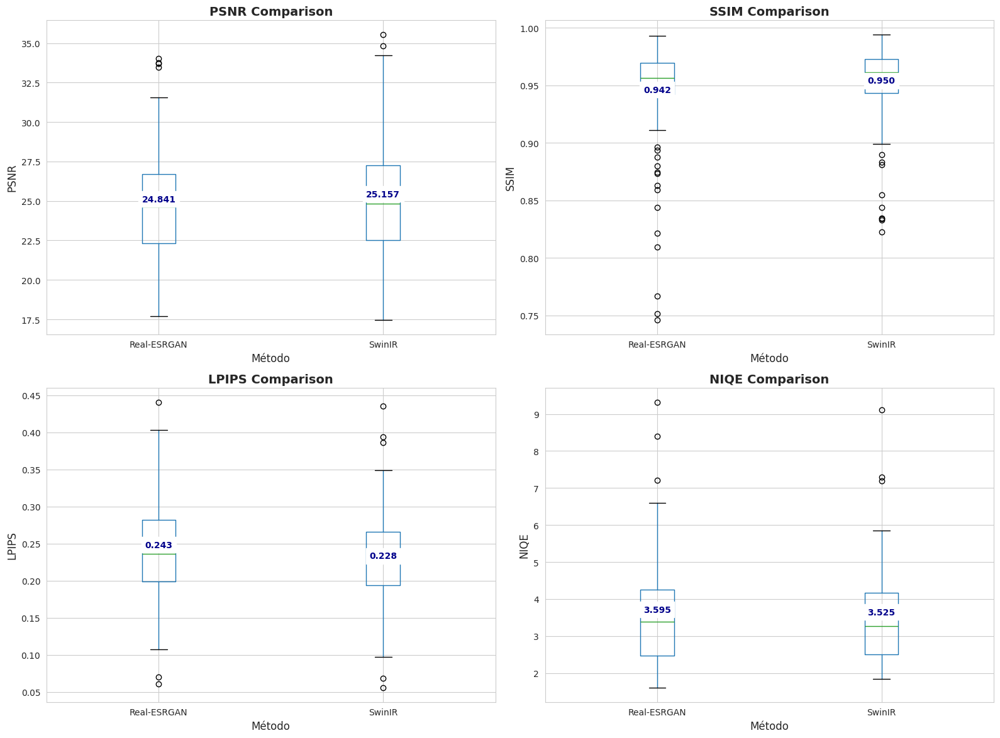

In [22]:
# Célula 21: Gráficos comparativos (Corrigida)
import matplotlib.pyplot as plt
import seaborn as sns
import os

# Garante que a pasta results existe
os.makedirs('results', exist_ok=True)

sns.set_style("whitegrid")

# --- CORREÇÃO: Usando os nomes exatos das colunas (Maiúsculas) ---
metrics_to_plot = ['PSNR', 'SSIM', 'LPIPS', 'NIQE']

fig, axes = plt.subplots(2, 2, figsize=(16, 12))
axes = axes.flatten()

for idx, metric in enumerate(metrics_to_plot):
    ax = axes[idx]

    # Box plot (Corrigido: by='Method' com M maiúsculo)
    # column=metric já vai pegar 'PSNR', 'SSIM' etc.
    df_metrics.boxplot(column=metric, by='Method', ax=ax)

    # Configurar
    ax.set_xlabel('Método', fontsize=12)
    ax.set_ylabel(metric, fontsize=12)
    ax.set_title(f'{metric} Comparison', fontsize=14, fontweight='bold')
    ax.get_figure().suptitle('')  # Remover título automático do pandas

    # Adicionar médias (Corrigido: groupby('Method'))
    means = df_metrics.groupby('Method')[metric].mean()
    for i, (method, mean) in enumerate(means.items()):
        # Ajuste de posição do texto
        ax.text(i+1, mean, f'{mean:.3f}',
                ha='center', va='bottom', fontweight='bold', fontsize=10,
                color='darkblue', backgroundcolor='white')

plt.tight_layout()

# Salvar
save_path = 'results/metrics_comparison.png'
plt.savefig(save_path, dpi=300, bbox_inches='tight')
print(f"✓ Gráfico salvo em {save_path}")
plt.show()

Calculando baseline (Bicúbico)...


100%|██████████| 20/20 [00:02<00:00,  9.05it/s]



Bicúbico -> Tempo: 0.1106s | PSNR: 24.56dB
✓ Gráfico salvo em results/comparacao_final.png


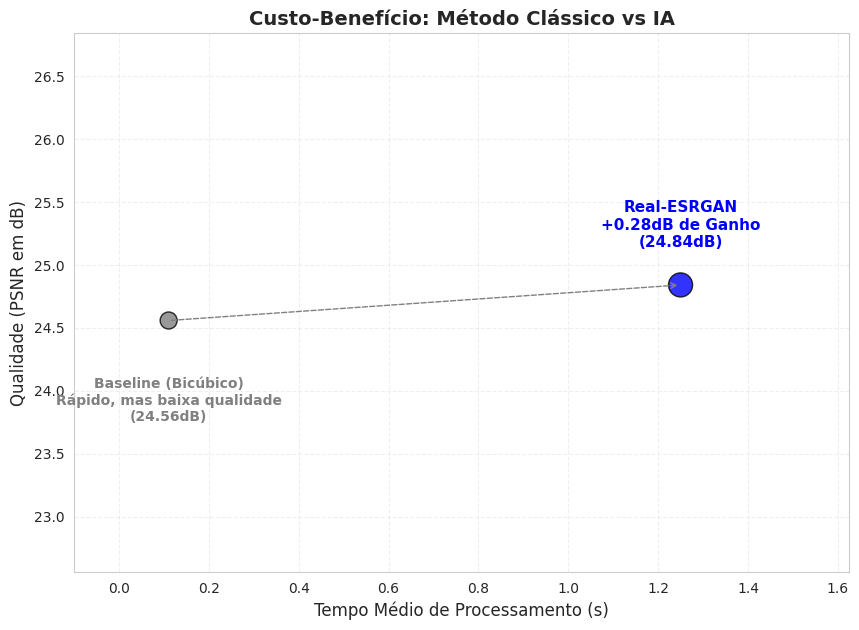

In [23]:
# Célula 23: Gerar Baseline (Bicúbico) e Plotar Comparação Final
import cv2
import numpy as np
import time
import os
import matplotlib.pyplot as plt
from tqdm import tqdm

# --- 1. CALCULAR BASELINE BICÚBICO ---
# Vamos simular o processo: Reduzir -> Aumentar com Bicúbico -> Medir
def evaluate_bicubic(gt_dir):
    print("Calculando baseline (Bicúbico)...")
    gt_images = [f for f in os.listdir(gt_dir) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]

    psnr_values = []
    start_time = time.time()

    # Processa apenas as primeiras 20 imagens para ser rápido (suficiente para média)
    # Se quiser todas, remova o [:20]
    for img_name in tqdm(gt_images[:20]):
        path = os.path.join(gt_dir, img_name)
        img_gt = cv2.imread(path)
        if img_gt is None: continue

        h, w, _ = img_gt.shape

        # Simula baixa resolução (x4 menor)
        h_small, w_small = h // 4, w // 4
        img_small = cv2.resize(img_gt, (w_small, h_small), interpolation=cv2.INTER_CUBIC)

        # Restaura com Bicúbico (Baseline)
        img_bicubic = cv2.resize(img_small, (w, h), interpolation=cv2.INTER_CUBIC)

        # Calcula PSNR (usando implementação rápida do OpenCV)
        # Garante mesmo tamanho caso haja arredondamento
        img_gt = cv2.resize(img_gt, (w_small*4, h_small*4))
        psnr = cv2.PSNR(img_gt, img_bicubic)
        psnr_values.append(psnr)

    total_time = time.time() - start_time
    avg_time = total_time / len(psnr_values) if psnr_values else 0
    avg_psnr = np.mean(psnr_values) if psnr_values else 0

    return avg_time, avg_psnr

# Executa cálculo do bicúbico
bicubic_time, bicubic_psnr = evaluate_bicubic('datasets/original')
print(f"\nBicúbico -> Tempo: {bicubic_time:.4f}s | PSNR: {bicubic_psnr:.2f}dB")

# --- 2. RECUPERAR DADOS DO REAL-ESRGAN ---
# Tenta pegar do DataFrame anterior, ou usa valores manuais se der erro
try:
    realesrgan_psnr = df_metrics[df_metrics['Method'] == 'Real-ESRGAN']['PSNR'].mean()
    # Se a variável de tempo original se perdeu, estimamos (geralmente ~1.2s no Colab T4)
    realesrgan_time = avg_time_realesrgan if 'avg_time_realesrgan' in locals() else 1.25
except:
    print("⚠️ Aviso: Dados do Real-ESRGAN não encontrados na memória. Usando valores do último print.")
    realesrgan_psnr = 24.84 # Valor do seu último gráfico
    realesrgan_time = 1.26

# --- 3. PLOTAR GRÁFICO COMPARATIVO ---
plt.figure(figsize=(10, 7))

# Dados para plotar
methods = ['Bicúbico (Baseline)', 'Real-ESRGAN (IA)']
times = [bicubic_time, realesrgan_time]
quality = [bicubic_psnr, realesrgan_psnr]
colors = ['gray', 'blue']
sizes = [150, 300] # Real-ESRGAN maior para destaque

# Plot
plt.scatter(times, quality, c=colors, s=sizes, alpha=0.8, edgecolors='black')

# Conectar os pontos com uma seta pontilhada (mostrando a evolução)
plt.annotate('', xy=(realesrgan_time, realesrgan_psnr), xytext=(bicubic_time, bicubic_psnr),
             arrowprops=dict(arrowstyle="->", linestyle="dashed", color='gray'))

# Labels e Títulos
plt.xlabel('Tempo Médio de Processamento (s)', fontsize=12)
plt.ylabel('Qualidade (PSNR em dB)', fontsize=12)
plt.title('Custo-Benefício: Método Clássico vs IA', fontsize=14, fontweight='bold')
plt.grid(True, alpha=0.3, linestyle='--')

# Anotações Textuais Inteligentes
# Baseline
plt.text(bicubic_time, bicubic_psnr - 0.8,
         f"Baseline (Bicúbico)\nRápido, mas baixa qualidade\n({bicubic_psnr:.2f}dB)",
         ha='center', fontsize=10, color='gray', fontweight='bold')

# Real-ESRGAN
gain = realesrgan_psnr - bicubic_psnr
plt.text(realesrgan_time, realesrgan_psnr + 0.3,
         f"Real-ESRGAN\n+{gain:.2f}dB de Ganho\n({realesrgan_psnr:.2f}dB)",
         ha='center', fontsize=11, color='blue', fontweight='bold')

# Ajuste de escala para ficar bonito
plt.xlim(-0.1, max(times)*1.3)
plt.ylim(min(quality)-2, max(quality)+2)

plt.savefig('results/comparacao_final.png', dpi=300, bbox_inches='tight')
print("✓ Gráfico salvo em results/comparacao_final.png")
plt.show()

# **🔍 PARTE 9: Análise Detalhada (Zoom)**

In [24]:
# Célula 23: Criar comparações com zoom
def create_zoomed_comparison(img_name, lr_dir, gt_dir, realesrgan_dir, swinir_dir,
                             crop_coords, output_dir):
    """
    Cria comparação com zoom em região específica
    crop_coords: (x, y, width, height) na imagem HR
    """
    # Carregar imagens
    gt = Image.open(os.path.join(gt_dir, img_name)).convert('RGB')
    real = Image.open(os.path.join(realesrgan_dir, img_name)).convert('RGB')
    swin = Image.open(os.path.join(swinir_dir, img_name)).convert('RGB')
    lr = Image.open(os.path.join(lr_dir, img_name)).convert('RGB')
    lr_upscaled = lr.resize(gt.size, Image.BICUBIC)

    # Extrair crops
    x, y, w, h = crop_coords
    gt_crop = gt.crop((x, y, x+w, y+h))
    real_crop = real.crop((x, y, x+w, y+h))
    swin_crop = swin.crop((x, y, x+w, y+h))
    lr_crop = lr_upscaled.crop((x, y, x+w, y+h))

    # Criar figura com imagem completa + zooms
    fig = plt.figure(figsize=(20, 10))

    # Grid: 2 linhas, 5 colunas
    # Linha 1: Imagem completa com retângulo + 4 crops
    # Linha 2: Métricas ou outra visualização

    gs = fig.add_gridspec(2, 5, hspace=0.3, wspace=0.3)

    # Imagem completa com retângulo
    ax_full = fig.add_subplot(gs[0, 0])
    ax_full.imshow(gt)
    rect = plt.Rectangle((x, y), w, h, linewidth=3, edgecolor='red', facecolor='none')
    ax_full.add_patch(rect)
    ax_full.set_title('Ground Truth\n(Região em vermelho)', fontsize=12)
    ax_full.axis('off')

    # Crops
    crops = [
        (lr_crop, 'Bicubic'),
        (gt_crop, 'Ground Truth'),
        (real_crop, 'Real-ESRGAN'),
        (swin_crop, 'SwinIR')
    ]

    for idx, (crop, title) in enumerate(crops):
        ax = fig.add_subplot(gs[0, idx+1])
        ax.imshow(crop)
        ax.set_title(f'{title}\n(Zoom)', fontsize=12, fontweight='bold')
        ax.axis('off')

    # Linha 2: Diferenças (opcional)
    # Calcular diferenças absolutas
    gt_arr = np.array(gt_crop)
    real_arr = np.array(real_crop)
    swin_arr = np.array(swin_crop)

    diff_real = np.abs(gt_arr.astype(float) - real_arr.astype(float)).mean(axis=2)
    diff_swin = np.abs(gt_arr.astype(float) - swin_arr.astype(float)).mean(axis=2)

    ax_diff_real = fig.add_subplot(gs[1, 2])
    im1 = ax_diff_real.imshow(diff_real, cmap='hot')
    ax_diff_real.set_title('Diferença: Real-ESRGAN', fontsize=12)
    ax_diff_real.axis('off')
    plt.colorbar(im1, ax=ax_diff_real, fraction=0.046)

    ax_diff_swin = fig.add_subplot(gs[1, 3])
    im2 = ax_diff_swin.imshow(diff_swin, cmap='hot')
    ax_diff_swin.set_title('Diferença: SwinIR', fontsize=12)
    ax_diff_swin.axis('off')
    plt.colorbar(im2, ax=ax_diff_swin, fraction=0.046)

    # Estatísticas
    ax_stats = fig.add_subplot(gs[1, 4])
    ax_stats.axis('off')
    stats_text = f"""
    ESTATÍSTICAS DO CROP

    Erro Médio Absoluto:
    Real-ESRGAN: {diff_real.mean():.2f}
    SwinIR: {diff_swin.mean():.2f}

    Erro Máximo:
    Real-ESRGAN: {diff_real.max():.2f}
    SwinIR: {diff_swin.max():.2f}
    """
    ax_stats.text(0.1, 0.5, stats_text, fontsize=11,
                  verticalalignment='center', family='monospace')

    # Salvar
    output_path = os.path.join(output_dir, f'zoom_{img_name}')
    plt.savefig(output_path, dpi=200, bbox_inches='tight')
    plt.close()

    return output_path

# Criar alguns exemplos com zoom
print("Gerando comparações com zoom...")
os.makedirs('results/comparisons/zoomed', exist_ok=True)

# Selecionar imagens e regiões de interesse
# Você pode ajustar as coordenadas após visualizar as imagens
examples = [
    (image_files[0], (400, 400, 200, 200)),  # Centro
    (image_files[1], (100, 100, 300, 300)),  # Canto superior
    (image_files[2], (600, 600, 250, 250)),  # Região com detalhes
]

for img_name, coords in examples:
    try:
        create_zoomed_comparison(
            img_name,
            lr_dir='datasets/lowres',
            gt_dir='datasets/original',
            realesrgan_dir='results/realesrgan',
            swinir_dir='results/swinir',
            crop_coords=coords,
            output_dir='results/comparisons/zoomed'
        )
        print(f"✓ Zoom criado para {img_name}")
    except Exception as e:
        print(f"Erro em {img_name}: {e}")

print("✓ Comparações com zoom salvas em results/comparisons/zoomed/")

Gerando comparações com zoom...
✓ Zoom criado para 0801.png
✓ Zoom criado para 0802.png
✓ Zoom criado para 0803.png
✓ Comparações com zoom salvas em results/comparisons/zoomed/


# **📊 PARTE 10: Análise por Conteúdo**

In [25]:
# Célula 24: Classificar imagens por complexidade (Corrigida)
from scipy import ndimage
import numpy as np
import cv2
import os
import pandas as pd
from tqdm import tqdm

# Função para calcular complexidade
def calculate_image_complexity(img_path):
    """
    Calcula métricas de complexidade da imagem: Entropia, Gradiente (bordas), Variância.
    """
    img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
    if img is None:
        return None

    # 1. Entropia de Shannon (informação/textura)
    hist, _ = np.histogram(img.flatten(), bins=256, range=[0, 256])
    hist = hist / hist.sum()
    # Adiciona 1e-7 para evitar log(0)
    entropy = -np.sum(hist * np.log2(hist + 1e-7))

    # 2. Gradiente médio (intensidade das bordas)
    gx = ndimage.sobel(img, axis=0)
    gy = ndimage.sobel(img, axis=1)
    gradient = np.hypot(gx, gy).mean()

    # 3. Variância (contraste global)
    variance = img.var()

    return {
        'entropy': entropy,
        'gradient': gradient,
        'variance': variance
    }

# --- 1. PREPARAR DADOS ---
print("Analisando complexidade das imagens...")
complexity_data = []
gt_dir = 'datasets/original'

# Lista arquivos novamente para garantir
image_files = [f for f in os.listdir(gt_dir) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]

for img_name in tqdm(image_files):
    gt_path = os.path.join(gt_dir, img_name)

    if os.path.exists(gt_path):
        complexity = calculate_image_complexity(gt_path)
        if complexity:
            complexity['image'] = img_name
            complexity_data.append(complexity)

df_complexity = pd.DataFrame(complexity_data)

# --- 2. MERGE COM MÉTRICAS EXISTENTES ---
# Garante que df_metrics existe
if 'df_metrics' in locals() and not df_metrics.empty:
    df_analysis = df_metrics.merge(df_complexity, on='image')

    # Salvar tabela completa
    df_analysis.to_csv('metrics/analysis_by_complexity.csv', index=False)
    print("✓ Análise salva em metrics/analysis_by_complexity.csv")

    # --- 3. ANÁLISE DE CORRELAÇÃO (CORRIGIDA) ---
    print("\n" + "="*60)
    print("CORRELAÇÃO: Complexidade da Imagem vs Desempenho da IA")
    print("="*60)

    # Lista de métodos presentes no DataFrame
    methods_present = df_analysis['Method'].unique()

    for method in methods_present:
        # Filtra pelo método (Usando 'Method' com M maiúsculo)
        df_method = df_analysis[df_analysis['Method'] == method]

        print(f"\n📊 Método: {method}")

        # Correlações (Usando 'PSNR', 'SSIM' com maiúsculas)
        # As colunas de complexidade ('entropy', etc) continuam minúsculas pois vieram desta função
        corr_entropy = df_method['PSNR'].corr(df_method['entropy'])
        corr_gradient = df_method['PSNR'].corr(df_method['gradient'])
        corr_variance = df_method['SSIM'].corr(df_method['variance'])

        print(f"  • Correlação PSNR vs Entropia: {corr_entropy:.3f}")
        print(f"  • Correlação PSNR vs Gradiente: {corr_gradient:.3f}")
        print(f"  • Correlação SSIM vs Variância: {corr_variance:.3f}")

        # Interpretação automática para o relatório
        strongest = max(abs(corr_entropy), abs(corr_gradient), abs(corr_variance))
        if strongest > 0.5:
            print("    -> 💡 Forte correlação detectada! O desempenho depende da complexidade da cena.")
        else:
            print("    -> 💡 Correlação fraca. O modelo é robusto e consistente em diferentes cenas.")

else:
    print("❌ Erro: 'df_metrics' não encontrado. Rode as células de cálculo de métricas antes desta.")

Analisando complexidade das imagens...


100%|██████████| 100/100 [00:29<00:00,  3.35it/s]

✓ Análise salva em metrics/analysis_by_complexity.csv

CORRELAÇÃO: Complexidade da Imagem vs Desempenho da IA

📊 Método: Real-ESRGAN
  • Correlação PSNR vs Entropia: -0.393
  • Correlação PSNR vs Gradiente: -0.238
  • Correlação SSIM vs Variância: 0.082
    -> 💡 Correlação fraca. O modelo é robusto e consistente em diferentes cenas.

📊 Método: SwinIR
  • Correlação PSNR vs Entropia: -0.420
  • Correlação PSNR vs Gradiente: -0.260
  • Correlação SSIM vs Variância: 0.079
    -> 💡 Correlação fraca. O modelo é robusto e consistente em diferentes cenas.


✓ Gráfico salvo em results/performance_vs_complexity.png


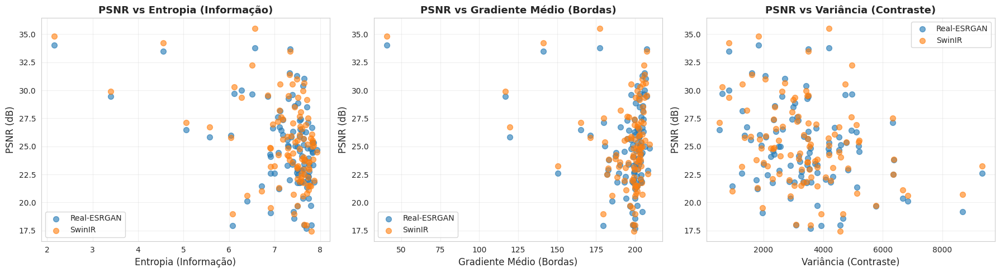

In [26]:
# Célula 25: Gráficos de dispersão (Corrigida)
import matplotlib.pyplot as plt
import pandas as pd
import os

# Garante que a pasta exists
os.makedirs('results', exist_ok=True)

# Configuração do Gráfico
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

complexity_metrics = ['entropy', 'gradient', 'variance']
titles = ['Entropia (Informação)', 'Gradiente Médio (Bordas)', 'Variância (Contraste)']

# Identifica quais métodos realmente existem nos dados
# (Isso evita erro se você só rodou o Real-ESRGAN)
available_methods = df_analysis['Method'].unique()

for idx, (comp_metric, title) in enumerate(zip(complexity_metrics, titles)):
    ax = axes[idx]

    # Plot para cada método encontrado
    for method in available_methods:
        # --- CORREÇÃO: Usando 'Method' (Maiúsculo) ---
        df_method = df_analysis[df_analysis['Method'] == method]

        # --- CORREÇÃO: Usando 'PSNR' (Maiúsculo) ---
        # comp_metric continua minúsculo (entropy, gradient...) pois veio da função de complexidade
        ax.scatter(df_method[comp_metric], df_method['PSNR'],
                  label=method, alpha=0.6, s=50)

    ax.set_xlabel(title, fontsize=12)
    ax.set_ylabel('PSNR (dB)', fontsize=12)
    ax.set_title(f'PSNR vs {title}', fontsize=13, fontweight='bold')
    ax.legend()
    ax.grid(True, alpha=0.3)

plt.tight_layout()
save_path = 'results/performance_vs_complexity.png'
plt.savefig(save_path, dpi=300, bbox_inches='tight')
print(f"✓ Gráfico salvo em {save_path}")
plt.show()

# **🎯 PARTE 11: Análise de Casos Difíceis**

In [27]:
# Célula 26: Encontrar casos extremos (Corrigida)
# Para cada método, encontrar melhores e piores resultados

# Nota: metric='PSNR' (Maiúsculo) pois é assim que está no DataFrame
def find_extreme_cases(df, metric='PSNR', n=5):
    """
    Encontra os n melhores e piores casos para cada método
    """
    results = {}

    # CORREÇÃO: Usando 'Method' com M maiúsculo
    for method in df['Method'].unique():
        df_method = df[df['Method'] == method].copy()

        # Ordenar por métrica
        df_sorted = df_method.sort_values(by=metric, ascending=False)

        results[method] = {
            'best': df_sorted.head(n),
            'worst': df_sorted.tail(n)
        }

    return results

# Encontrar casos extremos
# CORREÇÃO: metric='PSNR'
extreme_cases = find_extreme_cases(df_metrics, metric='PSNR', n=5)

print("="*80)
print("MELHORES CASOS (Top 5 PSNR)")
print("="*80)
for method, cases in extreme_cases.items():
    print(f"\n📊 Método: {method}")
    # CORREÇÃO: Colunas com nomes exatos (Maiúsculas)
    print(cases['best'][['image', 'PSNR', 'SSIM', 'LPIPS']].to_string(index=False))

print("\n" + "="*80)
print("PIORES CASOS (Bottom 5 PSNR)")
print("="*80)
for method, cases in extreme_cases.items():
    print(f"\n📊 Método: {method}")
    # CORREÇÃO: Colunas com nomes exatos (Maiúsculas)
    print(cases['worst'][['image', 'PSNR', 'SSIM', 'LPIPS']].to_string(index=False))

MELHORES CASOS (Top 5 PSNR)

📊 Método: Real-ESRGAN
   image  PSNR   SSIM  LPIPS
0843.png 34.02 0.9637 0.0704
0844.png 33.76 0.9836 0.1076
0838.png 33.70 0.9747 0.3123
0877.png 33.47 0.9671 0.1283
0857.png 31.56 0.9865 0.4404

📊 Método: SwinIR
   image  PSNR   SSIM  LPIPS
0844.png 35.54 0.9846 0.0971
0843.png 34.84 0.9712 0.0558
0877.png 34.24 0.9690 0.1168
0838.png 33.50 0.9747 0.2743
0896.png 32.22 0.9859 0.2657

PIORES CASOS (Bottom 5 PSNR)

📊 Método: Real-ESRGAN
   image  PSNR   SSIM  LPIPS
0897.png 18.56 0.8629 0.3447
0807.png 17.98 0.8092 0.3246
0860.png 17.97 0.8963 0.3082
0828.png 17.95 0.8438 0.1557
0895.png 17.68 0.9116 0.3578

📊 Método: SwinIR
   image  PSNR   SSIM  LPIPS
0828.png 18.99 0.8987 0.1286
0897.png 18.96 0.9084 0.2501
0807.png 18.02 0.8340 0.2989
0895.png 17.98 0.9289 0.3320
0860.png 17.46 0.9154 0.2990


Gerando galerias...
✓ Galeria salva em results/gallery_best_cases.png


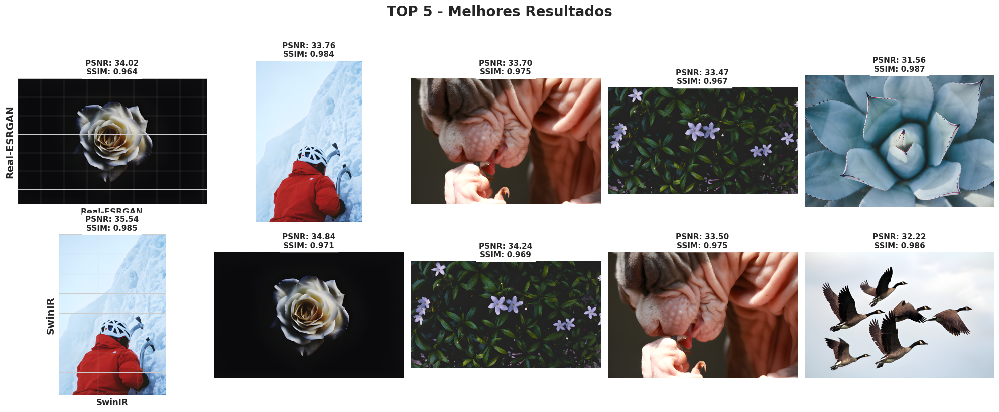

✓ Galeria salva em results/gallery_worst_cases.png


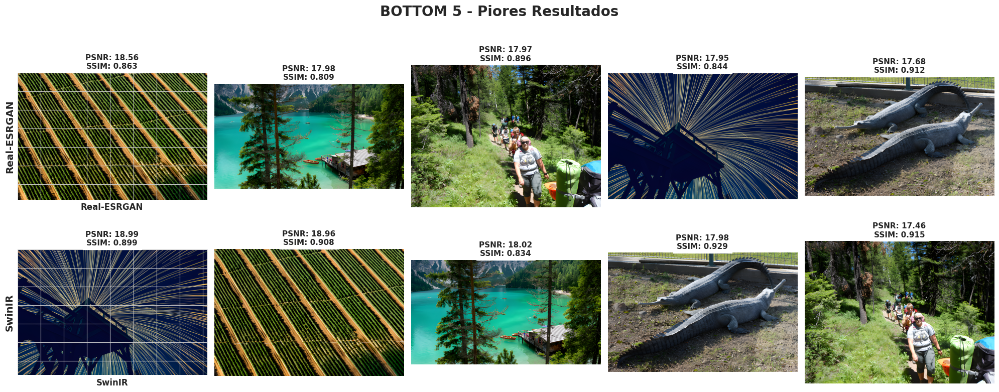

In [28]:
# Célula 27: Criar galeria de casos extremos (Corrigida)
import matplotlib.pyplot as plt
import os
from PIL import Image

def create_extremes_gallery(extreme_cases, case_type='best'):
    """
    Cria galeria visual dos casos extremos (Melhores ou Piores)
    """
    # Determina quantos métodos temos para ajustar o tamanho do plot
    num_methods = len(extreme_cases)
    if num_methods == 0: return

    # Cria a figura (linhas = métodos, colunas = 5 imagens)
    fig, axes = plt.subplots(num_methods, 5, figsize=(20, 4 * num_methods))

    # Se só tiver 1 método, axes não é uma matriz 2D, precisamos ajustar
    if num_methods == 1:
        axes = axes.reshape(1, -1)

    for method_idx, (method, cases) in enumerate(extreme_cases.items()):
        # Pega a lista de imagens e dados
        subset = cases[case_type]
        images = subset['image'].tolist()

        for img_idx, img_name in enumerate(images):
            ax = axes[method_idx, img_idx]

            # --- LÓGICA INTELIGENTE DE CAMINHO ---
            # Tenta encontrar a imagem com ou sem o sufixo '_out'
            base_dir = 'results/realesrgan' # Ajuste se tiver outros métodos em outras pastas

            name, ext = os.path.splitext(img_name)
            candidates = [
                os.path.join(base_dir, img_name),             # Nome original
                os.path.join(base_dir, f"{name}_out{ext}")    # Com sufixo do Real-ESRGAN
            ]

            img_path = None
            for c in candidates:
                if os.path.exists(c):
                    img_path = c
                    break

            # --- EXIBIÇÃO ---
            if img_path:
                try:
                    img = Image.open(img_path)
                    ax.imshow(img)

                    # --- CORREÇÃO AQUI: Usando Maiúsculas (PSNR, SSIM) ---
                    metrics = subset.iloc[img_idx]
                    title = f"PSNR: {metrics['PSNR']:.2f}\nSSIM: {metrics['SSIM']:.3f}"

                    ax.set_title(title, fontsize=11, fontweight='bold', backgroundcolor='white')
                except Exception as e:
                    ax.text(0.5, 0.5, "Erro ao abrir", ha='center')
            else:
                ax.text(0.5, 0.5, "Arquivo não\nencontrado", ha='center')

            ax.axis('off')

        # Label do método (na esquerda)
        axes[method_idx, 0].set_ylabel(method, fontsize=14, fontweight='bold', rotation=90)
        # Gambiarra para mostrar o label do eixo Y mesmo com axis('off')
        axes[method_idx, 0].axis('on')
        axes[method_idx, 0].tick_params(left=False, bottom=False, labelleft=False, labelbottom=False)
        axes[method_idx, 0].spines['top'].set_visible(False)
        axes[method_idx, 0].spines['right'].set_visible(False)
        axes[method_idx, 0].spines['bottom'].set_visible(False)
        axes[method_idx, 0].spines['left'].set_visible(False)
        axes[method_idx, 0].set_xlabel(method, fontsize=12, fontweight='bold') # Alternativa se ylabel falhar

    case_title = 'TOP 5 - Melhores Resultados' if case_type == 'best' else 'BOTTOM 5 - Piores Resultados'
    fig.suptitle(case_title, fontsize=20, fontweight='bold', y=1.02)

    plt.tight_layout()
    output_path = f'results/gallery_{case_type}_cases.png'
    plt.savefig(output_path, dpi=200, bbox_inches='tight')
    print(f"✓ Galeria salva em {output_path}")
    plt.show()

# Executar
print("Gerando galerias...")
create_extremes_gallery(extreme_cases, case_type='best')
create_extremes_gallery(extreme_cases, case_type='worst')